In [82]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable

import torchvision
from torchvision import datasets
from torchvision import transforms
from torchvision.utils import save_image

from pushover import notify
from summary import summary

import imageio
from pathlib import Path
from IPython.display import Image

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
bs = 32

In [5]:
def to_var(x):
    if torch.cuda.is_available():
        x = x.cuda()
    return Variable(x)

In [112]:
def save_image(x, path='real_image.png'):
    torchvision.utils.save_image(x, path)

In [116]:
# Load Data
dataset = datasets.FashionMNIST(root='./data', train=True, transform=transforms.Compose([
    transforms.Resize(64),
    transforms.ToTensor(), 
]), download=True)
data_loader = torch.utils.data.DataLoader(dataset, batch_size=bs, shuffle=True)

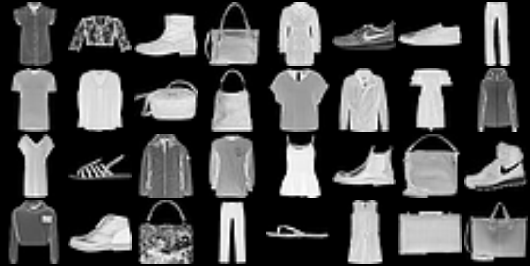

In [117]:
# Fixed input for debugging
fixed_x, _ = next(iter(data_loader))
save_image(fixed_x)
fixed_x = to_var(fixed_x)

Image('real_image.png')

In [118]:
class Flatten(nn.Module):
    def forward(self, input):
        return input.view(input.size(0), -1)

In [119]:
class UnFlatten(nn.Module):
    def forward(self, input, size=1024):
        return input.view(input.size(0), size, 1, 1)

In [120]:
class VAE(nn.Module):
    def __init__(self, image_channels=3, h_dim=1024, z_dim=32):
        super(VAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(image_channels, 32, kernel_size=4, stride=2),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=4, stride=2),
            nn.ReLU(),
            Flatten()
        )
        
        self.fc1 = nn.Linear(h_dim, z_dim)
        self.fc2 = nn.Linear(h_dim, z_dim)
        self.fc3 = nn.Linear(z_dim, h_dim)
        
        self.decoder = nn.Sequential(
            UnFlatten(),
            nn.ConvTranspose2d(h_dim, 128, kernel_size=5, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=5, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=6, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(32, image_channels, kernel_size=6, stride=2),
            nn.Sigmoid(),
        )
        
    def reparameterize(self, mu, logvar):
        std = logvar.mul(0.5).exp_()
        esp = to_var(torch.randn(*mu.size()))
        z = mu + std * esp
        return z
    
    def bottleneck(self, h):
        mu, logvar = self.fc1(h), self.fc2(h)
        z = self.reparameterize(mu, logvar)
        z = self.fc3(z)
        return z, mu, logvar
        
    
    def forward(self, x):
        h = self.encoder(x)
        z, mu, logvar = self.bottleneck(h)
        return self.decoder(z), mu, logvar

In [126]:
vae = VAE(image_channels=1)
if torch.cuda.is_available():
    vae.cuda()
# vae
# summary((3, 64, 64), vae)

In [127]:
optimizer = torch.optim.RMSprop(vae.parameters(), lr=1e-3) 

In [128]:
def loss_fn(recon_x, x, mu, logvar):
    # BCE = F.binary_cross_entropy(recon_x, x, size_average=False)
    BCE = F.mse_loss(recon_x, x, size_average=False)

    # see Appendix B from VAE paper:
    # Kingma and Welling. Auto-Encoding Variational Bayes. ICLR, 2014
    # 0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
    KLD = -0.5 * torch.sum(1 + logvar - mu**2 -  logvar.exp())
    return BCE + KLD

In [129]:
!rm -rfr reconstructed/*
epochs = 5

In [130]:
for epoch in range(epochs):
    for idx, (images, _) in enumerate(data_loader):
        images = to_var(images)
        recon_images, mu, logvar = vae(images)
        loss = loss_fn(recon_images, images, mu, logvar)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        if idx%100 == 0:
            print("Epoch[{}/{}] Loss: {:.3f}".format(epoch+1, epochs, loss.data[0]/bs))
    
            recon_x, _, _ = vae(fixed_x)
            save_image(recon_x.data.cpu(), f'reconstructed/recon_image_{epoch}_{idx}.png')

notify("Loss: {:.3f}".format(loss.data[0]/bs), priority=1)

Epoch[1/5] Loss: 665.546
Epoch[1/5] Loss: 149.099
Epoch[1/5] Loss: 120.619
Epoch[1/5] Loss: 119.326
Epoch[1/5] Loss: 109.114
Epoch[1/5] Loss: 105.257
Epoch[1/5] Loss: 87.832
Epoch[1/5] Loss: 87.721
Epoch[1/5] Loss: 92.817
Epoch[1/5] Loss: 98.058
Epoch[1/5] Loss: 103.909
Epoch[1/5] Loss: 96.754
Epoch[1/5] Loss: 105.489
Epoch[1/5] Loss: 80.090
Epoch[1/5] Loss: 81.024
Epoch[1/5] Loss: 82.239
Epoch[1/5] Loss: 81.620
Epoch[1/5] Loss: 89.443
Epoch[1/5] Loss: 91.752
Epoch[2/5] Loss: 92.220
Epoch[2/5] Loss: 77.885
Epoch[2/5] Loss: 84.220
Epoch[2/5] Loss: 70.906
Epoch[2/5] Loss: 81.264
Epoch[2/5] Loss: 75.013
Epoch[2/5] Loss: 67.135
Epoch[2/5] Loss: 73.430
Epoch[2/5] Loss: 69.945
Epoch[2/5] Loss: 70.911
Epoch[2/5] Loss: 84.502
Epoch[2/5] Loss: 65.971
Epoch[2/5] Loss: 77.295
Epoch[2/5] Loss: 80.859
Epoch[2/5] Loss: 81.755
Epoch[2/5] Loss: 79.937
Epoch[2/5] Loss: 73.082
Epoch[2/5] Loss: 63.862
Epoch[2/5] Loss: 66.343
Epoch[3/5] Loss: 72.205
Epoch[3/5] Loss: 69.708
Epoch[3/5] Loss: 66.122
Epoch[3/

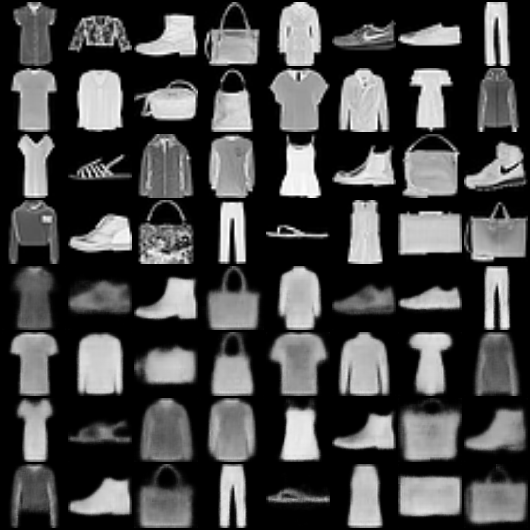

In [131]:
sample = to_var(torch.randn(bs, 1024))
recon_x = vae.decoder(sample)

recon_x, _, _ = vae(fixed_x)
recon_x = torch.cat([fixed_x, recon_x])

save_image(recon_x.data.cpu(), 'sample_image.png')
Image('sample_image.png')

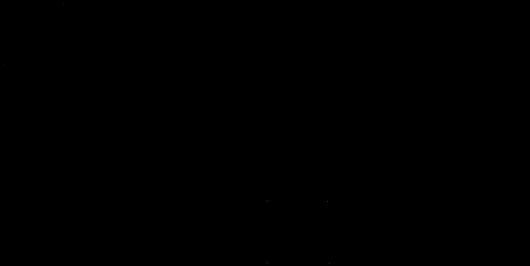

In [132]:
images = []
for file in sorted([file for file in Path('reconstructed').glob('*.png')]):
    images.append(imageio.imread(file))
imageio.mimsave('recon_image.gif', images)
Image(filename="recon_image.gif")